<a href="https://colab.research.google.com/github/btcain44/Applied_Deep_Learning/blob/main/Depth_Estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Bi-Weekly Report #6
### Brian Cain
#### Depth_Estimation.ipynb

In this notebook I will explore topics from the <b>Optical Flow and Depth Estimation</b> module covered in class. Specifically, I will focus on <b>Supervised Depth Estimation</b> to generate depth estimation output for the DIODE dataset. (Dense Indoor and Outdoor Depth Dataset).

To get ahold of the DIODE dataset and properly format the images/depth photos I followed the first section of this tutorial https://keras.io/examples/vision/depth_estimation/. This tutorial was helpful because the DIODE dataset was stored in an Amazon S3 data bucket, which I'd had no prior experience interacting with, so this also served as a good lesson to work with that platform. 

<b>Pull in and format the data with help of the tutorial:</b>

Import necessary packages:

In [ ]:
##Import packages to load data from AWS into collab directory
import os
import sys

##Import tensorflow packages to build models
import tensorflow as tf
from tensorflow.keras import layers

##Import numpy and cv2 to work with loaded image data
import numpy as np
import cv2
import pandas as pd

##Import plotting package
import matplotlib.pyplot as plt


Download the data to a Collab storage location from the Amazon s3 bucket:

In [ ]:
##Download Diode data from amazon web services
annotation_folder = "/dataset/"
if not os.path.exists(os.path.abspath(".") + annotation_folder):
    annotation_zip = tf.keras.utils.get_file(
        "val.tar.gz",
        cache_subdir=os.path.abspath("."),
        origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",
        extract=True,)

2774638592/2774625282 [==============================] - 78s 0us/step


In [ ]:
##Identify the path to now extract the images from
path = "val/indoors"

##Initiate a stoage location for which to store data file names
filelist = []

##Loop through directory of amazon data and add data names to file list
for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

##Create a dictionary of all data file names
filelist.sort()
data = {
    "image": np.array([x for x in filelist if x.endswith(".png")]),
    "depth": np.array([x for x in filelist if x.endswith("_depth.npy")]),
    "mask": np.array([x for x in filelist if x.endswith("_depth_mask.npy")]),
}
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42)

Define a loading function to properly pull in <b>Indoor</b> image data and the corresponding depth ground truthes.  

In [ ]:
def load(image_path, depth_path, mask_path, photo_dim):
  
  ##Load image as RGB and correct float type
  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image, photo_dim)
  image = tf.image.convert_image_dtype(image, tf.float32)

  ##Load the depth map
  depth_map = np.load(depth_path).squeeze()

  ##Load the mask
  mask = np.load(mask_path)
  mask = mask > 0 

  ##Properly transform the depth map so the image makes sense
  max_depth = min(300, np.percentile(depth_map, 99))
  depth_map = np.clip(depth_map, np.min(depth_map), max_depth)
  depth_map = np.log(depth_map, where=mask)
  depth_map = np.ma.masked_where(~mask, depth_map)
  depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
  depth_map = cv2.resize(depth_map, photo_dim)
  depth_map = np.expand_dims(depth_map, axis=2)

  return image, depth_map

### Exploratory Data Analysis

I will temporarily divert from the <b>Keras.io</b> tutorial and do some data analysis.

The first step in this process, is performing extensive Exploratory Data Analysis. Since I have never worked on a depth estimation problem before, this stage will be crucial for getting to know the data and potentially thinking of something novel to do to try and improve depth estimation. 

Let's get a quick first look at the image data by selecting some random images to view. 

In [ ]:
##Use the data functions from above to load all data into a couple arrays
images = []
depths = []

##Loop through file names
for i in range(len(data['image'])):
  img, dep = load(data['image'][i], data['depth'][i], data['mask'][i], (256,256))
  images.append(img)
  depths.append(dep)

##Convert these into numpy arrays (I prefer working with numpy arrays for functionality at times)
images = np.array(images)
depths = np.array(depths)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: This function is deprecated. Please call randint(1, 325 + 1) instead
  


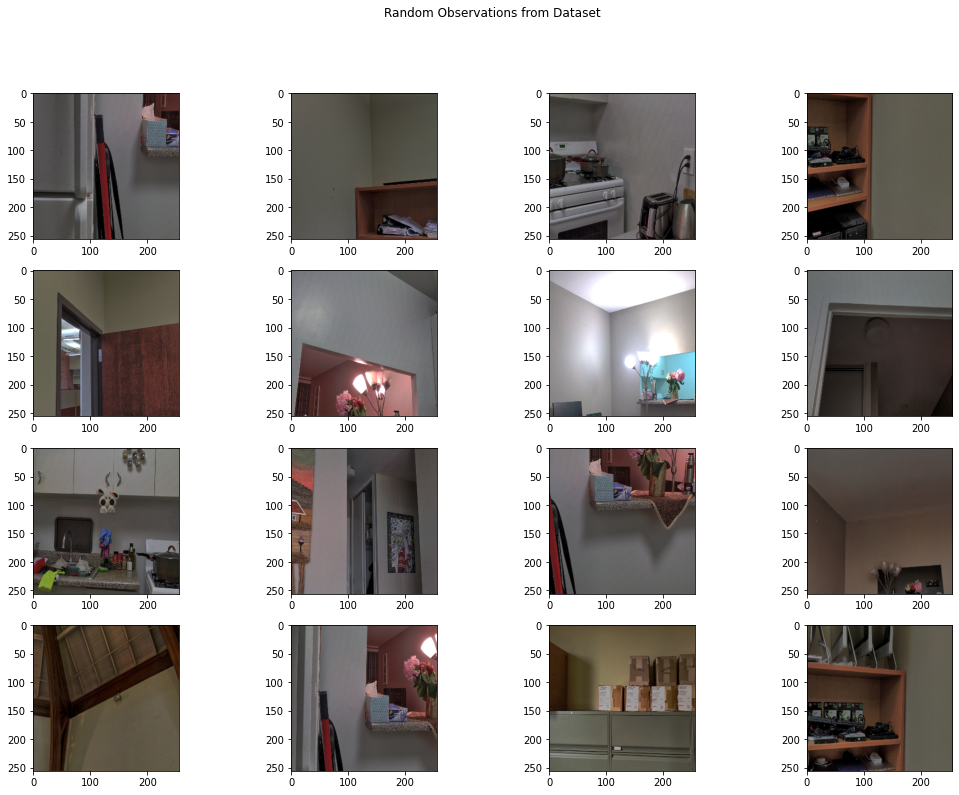

In [ ]:
##Use function to plot random image from previous notebooks
##Define a function that will display random samples for each class for us
def display_rand_samples(rows,columns,imgData):
  
  ##Generate random samples
  randomSamples = np.random.random_integers(len(imgData),size=rows*columns)

  ##Create figure to output images onto
  fig, ax = plt.subplots(rows,columns,figsize=(15,10))

  ##Loop through labels to display random samples for each label onto subplot
  ct = 0
  for i in range(rows):
    for j in range(columns):
      ax[i,j].imshow(imgData[randomSamples[ct]],cmap='gray')
      ct+=1

  ##Format overall plot structure
  fig.suptitle('Random Observations from Dataset',y=1.1)
  fig.tight_layout()

##Call the function to plot random observations 
np.random.seed(3) ##Set random seed so visualization results can be replicated
display_rand_samples(4,4,images)

These are some pretty simple images displayed above randomly selected from the indoor dataset. Just by looking at these images, these are my preliminary observations for what things might make this depth estimation problem difficult:
* Row 2, Column 3, the lighting reflecting from the lamp onto the wall could confuse a depth estimation algorithm into misclassifying the depth in that region
* Row 4, Column 1, even with the bare eye, this image of the ceiling and wall is tough to interpret in terms of depth estimation. I can't tell if the ceiling is further, or the wall is further. My thought is an supervised depth estimation algorithm would have similar troubles. 
* Row 3, Column 3, the shadow reflecting on the wall from the counter-top could throw off a classification algorithm because the shadow could make the depth look further of closer in the eyes of a nueral network

Now lets examine what the ground truth depth photos look like for some of the random images. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: This function is deprecated. Please call randint(1, 325 + 1) instead
  if __name__ == '__main__':


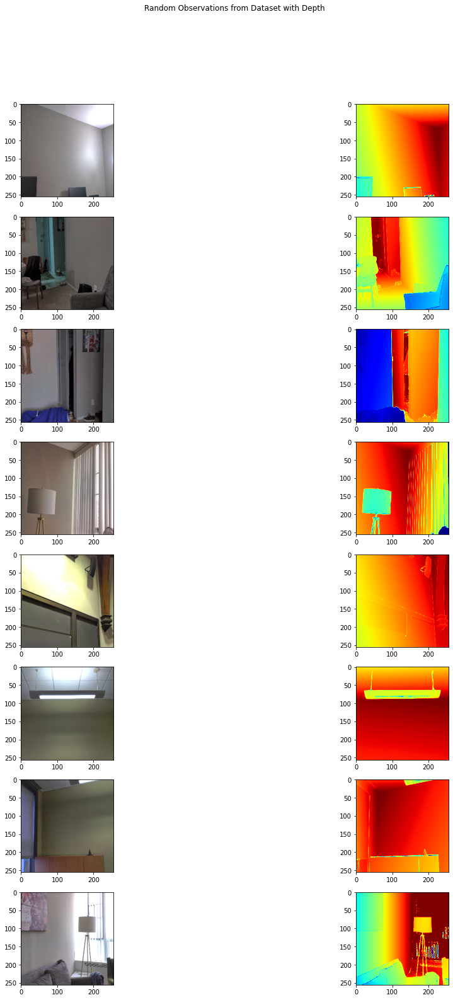

In [ ]:
##SLIGHT ALTERATION OF DISPLAY RANDOM SAMPLES FUNCTION TO ACCOMPLISH THIS.
##CREATED A NEW FUNCTION SO NOT TO OVERWRITE THE OLD ONE.

##Use function to plot random image from previous notebooks
##Define a function that will display random samples for each class for us
def display_depth_rand_samples(num_samples,imgData,depthData):
  
  ##Generate random samples
  randomSamples = np.random.random_integers(len(imgData),size=num_samples)

  ##Create figure to output images onto
  fig, ax = plt.subplots(num_samples,2,figsize=(20,20))

  ##Define proper heat map settings for the depth images
  cmap = plt.cm.jet
  cmap.set_bad(color='black')
  plt.imshow(dep.squeeze(),cmap=cmap)

  ##Loop through labels to display random samples for each label onto subplot
  for i in range(num_samples):
    ax[i,0].imshow(imgData[randomSamples[i]],cmap='gray')
    ax[i,1].imshow(depthData[randomSamples[i]].squeeze(),cmap=cmap)

  ##Format overall plot structure
  fig.suptitle('Random Observations from Dataset with Depth',y=1.1)
  fig.tight_layout()

##Call the function to plot random observations 
np.random.seed(5) ##Set random seed so visualization results can be replicated
display_depth_rand_samples(8,images,depths)

We can note that the heat map has warmer (close to red) colors at farther away points of the images, and colder (closer to blue) colors at nearer points in the image. 

A few observations from looking over this data:
* In row 4, the heatmap also almost acts like a segmentation algorithm as the lamp is the only part of the image in the foreground, while the wall is all red

Looking at these images actually gives me an idea. We can notice that often times the depth seems to either become further or closer as we move from one object to the next. Or in other words, at edges of objects, the depth seems to change suddenly once the edge is surpassed. Therefore, a question can be posed, would somehow intergating edge detection into a depth estimation model add any value?

Furthermore, much like a contour map shows gives us an idea about the heights of items in a landscape, could edge detection act similarly to indicate to an algorithm where objects (like contour mountains) end and the depth changes?

Below to emphasize this point, I included a visualization of a geographical contour heatmap. 

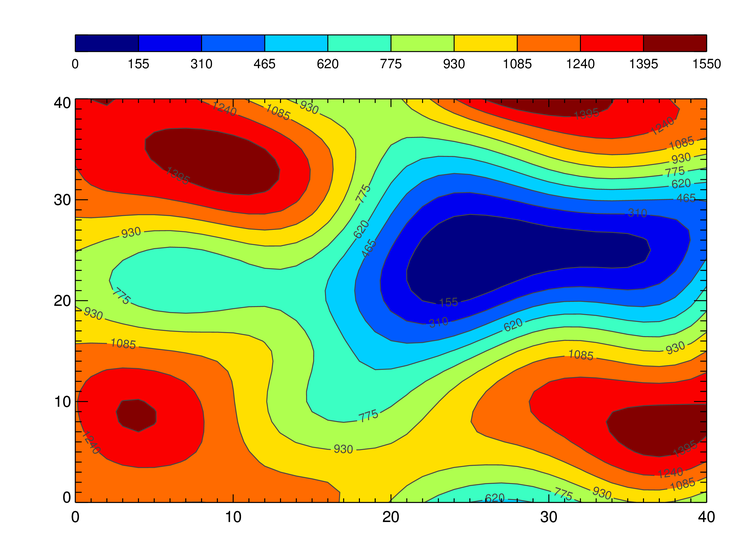

In order to try this out, I created a process below using the OpenCV package that applies Sobel Edge detection onto images to try and help indicate where objects end. In a previous notebook, I used Canny edge detection, so I switched it up here to try out a new edge detection method and gain more experience with a diversity of techniques. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: DeprecationWarning: This function is deprecated. Please call randint(1, 325 + 1) instead


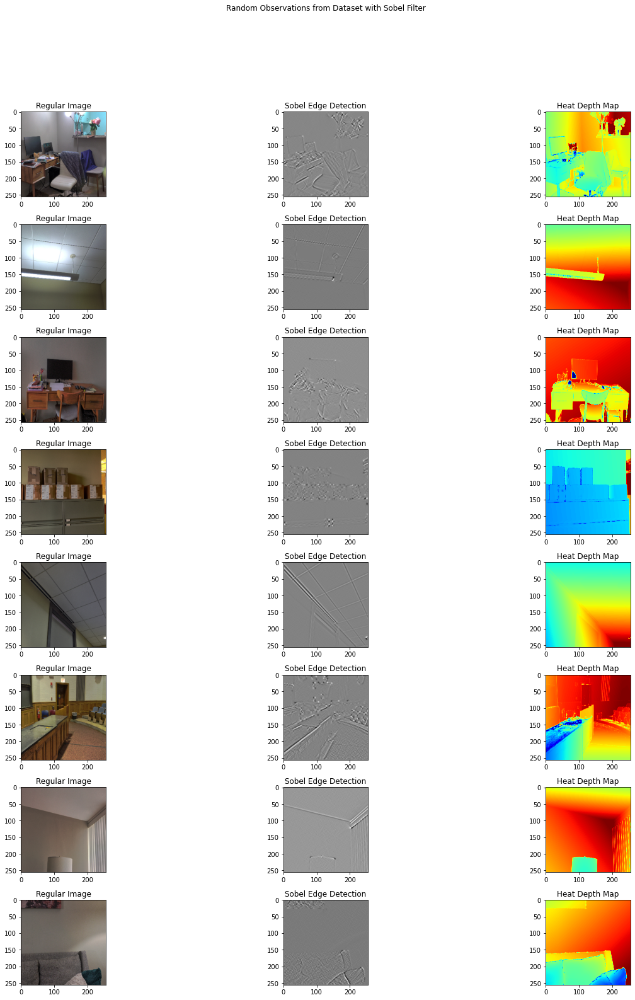

In [ ]:
##Import the corresponding package to perform canny edge detection
import cv2

##Create new train/test sets using canny edge detectioncanny = []
sobel = []

##Transform data using canny edge detection
for i in range(len(images)):
  img_gray = cv2.cvtColor(images[i], cv2.COLOR_RGB2GRAY)
  img_blur = cv2.GaussianBlur(img_gray, (3,3), 0) 
  sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=7)
  sobel.append(sobelxy)

##Transform these into numpy arrays
sobel = np.array(sobel)

##Now lets plot the results
##Use function to plot random image from previous notebooks
##Define a function that will display random samples for each class for us
def display_sobel_rand_samples(num_samples,imgData,sobelData,depthData):
  
  ##Generate random samples
  randomSamples = np.random.random_integers(len(imgData),size=num_samples)

  ##Define proper heat map settings for the depth images
  cmap = plt.cm.jet
  cmap.set_bad(color='black')

  ##Create figure to output images onto
  fig, ax = plt.subplots(num_samples,3,figsize=(20,20))

  ##Loop through labels to display random samples for each label onto subplot
  for i in range(num_samples):
    ax[i,0].imshow(imgData[randomSamples[i]],cmap='gray')
    ax[i,1].imshow(sobelData[randomSamples[i]].squeeze(),cmap='gray')
    ax[i,2].imshow(depthData[randomSamples[i]].squeeze(),cmap=cmap)

    ax[i,0].set_title('Regular Image')
    ax[i,1].set_title('Sobel Edge Detection')
    ax[i,2].set_title('Heat Depth Map')

  ##Format overall plot structure
  fig.suptitle('Random Observations from Dataset with Sobel Filter',y=1.1)
  fig.tight_layout()

##Call the function to plot random observations from each super-class (coarse labels)
np.random.seed(6) ##Set random seed so visualization results can be replicated
display_sobel_rand_samples(8,images,sobel,depths)

Initially looking at these results, I'm not sure if sobel edge detection as a 4th color channel is a great idea to help the model identify depth estimation. However, I still think its a cool idea and it will be interesting to see how it effects the results vs. a model that uses no sobel edge detection. 

As a last part of this EDA section, let's explore what the images look like when we add the Sobel Filter result as the 4th color channel. 

Below I define a function that stacks the Sobel Channel onto the regular RGB photo. 

In [ ]:
##Define function to stack an image with all its transformations
def stack_images(imgArray,sobelImg):

  ##Combine all into one image
  stackedImg = np.dstack((imgArray,sobelImg))

  return stackedImg

In [ ]:
##Create new training and test set
sobel_stack = []

##Perform operations on images
for i,j in zip(images,sobel):
  sobel_stack.append(stack_images(i,j))

##Format these as numpy arrays
sobel_stack = np.array(sobel_stack)

Now lets display the results of doing this:

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DeprecationWarning: This function is deprecated. Please call randint(1, 325 + 1) instead
  
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] fo

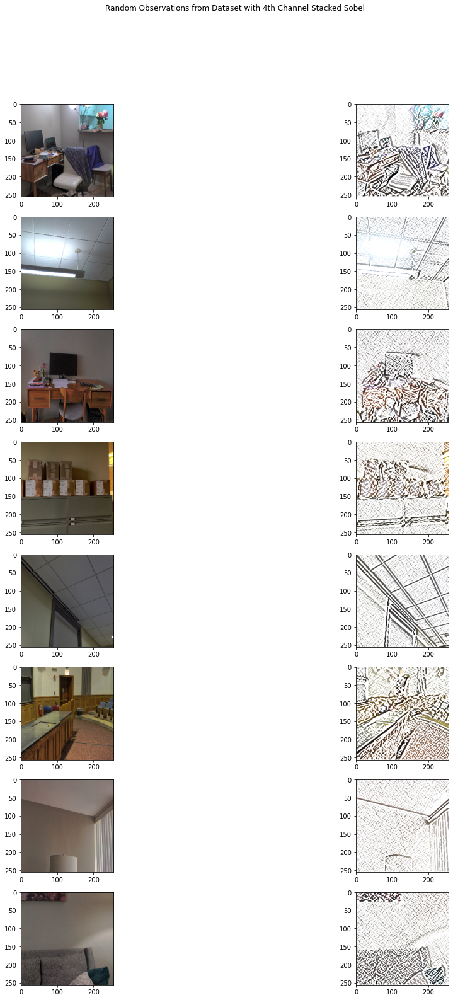

In [ ]:
##Display the results by re-using random plotting function from above

##Use function to plot random image from previous notebooks
##Define a function that will display random samples for each class for us
def display_stack_rand_samples(num_samples,imgData,stackData):
  
  ##Generate random samples
  randomSamples = np.random.random_integers(len(imgData),size=num_samples)

  ##Create figure to output images onto
  fig, ax = plt.subplots(num_samples,2,figsize=(20,20))

  ##Loop through labels to display random samples for each label onto subplot
  for i in range(num_samples):
    ax[i,0].imshow(imgData[randomSamples[i]],cmap='gray')
    ax[i,1].imshow(stackData[randomSamples[i]].squeeze(),cmap='gray')

  ##Format overall plot structure
  fig.suptitle('Random Observations from Dataset with 4th Channel Stacked Sobel',y=1.1)
  fig.tight_layout()

##Call the function to plot random observations from each super-class (coarse labels)
np.random.seed(6) ##Set random seed so visualization results can be replicated
display_stack_rand_samples(8,images,sobel_stack)

Seeing these results, it would appear that a fair amount of information is lost when adding this 4th color channel of the Sobel filter, as opposed to just the plain image. I am still interested to see the results because the network will still have access to the RGB color channels as well as the Sobel filter. So, should the Sobel filter add nothing, the network may choose to ignore it. 

### Creating the Depth Estimation Model

Here is where I start to reconvene with the <b>keras.io</b> depth estimation tutorial listed above. Given my lack of experience with a lot of the depth estimation architecture, I felt it necessary to learn from this tutorial in my first attempt so that in the future I could be more flexible with my experimentation with similar architectures. However, I did make some changes to the model to get my hands dirty and not be totally tutorial dependent. When I make these changes, I will make note of them in text sections!

Here are a few things that I did change in the DataGenerator immediatley below:
* In the Data Generator definition, I adjusted the number of channels to be 4 so that I could try out the Sobel Edge detection data with the model
* In the Data Generator load pre-processing step, I added in the process for creating the Sobel edge detection channel and then adding it to the original image before it is used for model training

Immediatley below I will defined the model:

In [ ]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=32, dim=(768, 1024), n_channels=4, shuffle=True):
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):

        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self,image_path, depth_map, mask):
        """Load input and target image."""

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)
        img_gray = cv2.cvtColor(np.float32(image_), cv2.COLOR_RGB2GRAY)
        img_blur = cv2.GaussianBlur(img_gray, (3,3), 0) 
        sobel_xy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=7)
        image_ = stack_images(image_,sobel_xy)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )

        return x, y


Below the Downscale, Upscale, and Bottleneck components of the model are defined:

In [ ]:
class DownscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha=0.2)
        self.reluB = layers.LeakyReLU(alpha=0.2)
        self.bn2a = tf.keras.layers.BatchNormalization()
        self.bn2b = tf.keras.layers.BatchNormalization()

        self.pool = layers.MaxPool2D((2, 2), (2, 2))

    def call(self, input_tensor):
        d = self.convA(input_tensor)
        x = self.bn2a(d)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        x += d
        p = self.pool(x)
        return x, p


class UpscaleBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.us = layers.UpSampling2D((2, 2))
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha=0.2)
        self.reluB = layers.LeakyReLU(alpha=0.2)
        self.bn2a = tf.keras.layers.BatchNormalization()
        self.bn2b = tf.keras.layers.BatchNormalization()
        self.conc = layers.Concatenate()

    def call(self, x, skip):
        x = self.us(x)
        concat = self.conc([x, skip])
        x = self.convA(concat)
        x = self.bn2a(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        return x


class BottleNeckBlock(layers.Layer):
    def __init__(
        self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs
    ):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(alpha=0.2)
        self.reluB = layers.LeakyReLU(alpha=0.2)

    def call(self, x):
        x = self.convA(x)
        x = self.reluA(x)
        x = self.convB(x)
        x = self.reluB(x)
        return x



Below the depth estimation model where all architecture is combined and the loss function are defined:

In [ ]:
class DepthEstimationModel(tf.keras.Model):
    def __init__(self):
        super().__init__()
        self.ssim_loss_weight = 0.85
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = tf.keras.metrics.Mean(name="loss")
        f = [16, 32, 64, 128, 256]
        self.downscale_blocks = [
            DownscaleBlock(f[0]),
            DownscaleBlock(f[1]),
            DownscaleBlock(f[2]),
            DownscaleBlock(f[3]),
        ]
        self.bottle_neck_block = BottleNeckBlock(f[4])
        self.upscale_blocks = [
            UpscaleBlock(f[3]),
            UpscaleBlock(f[2]),
            UpscaleBlock(f[1]),
            UpscaleBlock(f[0]),
        ]
        self.conv_layer = layers.Conv2D(1, (1, 1), padding="same", activation="tanh")

    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = tf.image.image_gradients(target)
        dy_pred, dx_pred = tf.image.image_gradients(pred)
        weights_x = tf.exp(tf.reduce_mean(tf.abs(dx_true)))
        weights_y = tf.exp(tf.reduce_mean(tf.abs(dy_true)))

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = tf.reduce_mean(abs(smoothness_x)) + tf.reduce_mean(
            abs(smoothness_y)
        )

        # Structural similarity (SSIM) index
        ssim_loss = tf.reduce_mean(
            1
            - tf.image.ssim(
                target, pred, max_val=WIDTH, filter_size=7, k1=0.01 ** 2, k2=0.03 ** 2
            )
        )
        # Point-wise depth
        l1_loss = tf.reduce_mean(tf.abs(target - pred))

        loss = (
            (self.ssim_loss_weight * ssim_loss)
            + (self.l1_loss_weight * l1_loss)
            + (self.edge_loss_weight * depth_smoothness_loss)
        )

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {
            "loss": self.loss_metric.result(),
        }

    def call(self, x):
        c1, p1 = self.downscale_blocks[0](x)
        c2, p2 = self.downscale_blocks[1](p1)
        c3, p3 = self.downscale_blocks[2](p2)
        c4, p4 = self.downscale_blocks[3](p3)

        bn = self.bottle_neck_block(p4)

        u1 = self.upscale_blocks[0](bn, c4)
        u2 = self.upscale_blocks[1](u1, c3)
        u3 = self.upscale_blocks[2](u2, c2)
        u4 = self.upscale_blocks[3](u3, c1)

        return self.conv_layer(u4)



<b>Sobel Model Training</b>

In the section below, I will use the altered DataGenerator to train the model first using the altered 4-channel Sobel Edge detection images that I have generated.

In [ ]:
##Define some variables required by the model definition
WIDTH = 256
HEIGHT = 256
BATCH_SIZE = 32

##Define the optimizer to be the Adam
optimizer = tf.keras.optimizers.Adam()
modelSobel = DepthEstimationModel()

# Define the loss function
cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction="none")

# Compile the model
modelSobel.compile(optimizer, loss=cross_entropy)

train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"), batch_size=32, dim=(256, 256))
validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"), batch_size=32, dim=(256, 256))

##Fit the model
modelSobel.fit(train_loader,epochs=100,validation_data=validation_loader,)

Epoch 1/100
9/9 [==============================] - 12s 914ms/step - loss: 0.7823 - val_loss: 1.7730
Epoch 2/100
9/9 [==============================] - 2s 248ms/step - loss: 0.5781 - val_loss: 1.8009
Epoch 3/100
9/9 [==============================] - 2s 277ms/step - loss: 0.4651 - val_loss: 1.7516
Epoch 4/100
9/9 [==============================] - 2s 250ms/step - loss: 0.4052 - val_loss: 1.7452
Epoch 5/100
9/9 [==============================] - 2s 236ms/step - loss: 0.3862 - val_loss: 1.6973
Epoch 6/100
9/9 [==============================] - 2s 249ms/step - loss: 0.3819 - val_loss: 1.5374
Epoch 7/100
9/9 [==============================] - 2s 261ms/step - loss: 0.3932 - val_loss: 0.8531
Epoch 8/100
9/9 [==============================] - 2s 271ms/step - loss: 0.3354 - val_loss: 1.7891
Epoch 9/100
9/9 [==============================] - 2s 253ms/step - loss: 0.3594 - val_loss: 1.6628
Epoch 10/100
9/9 [==============================] - 2s 227ms/step - loss: 0.2764 - val_loss: 0.8905
Epoch 11

We can see that over 100 epochs, the model training leveled off at a validation loss of around .115 around the 50th epoch. Below we will visualize some of the results of this model on the test data and then interpret these results. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

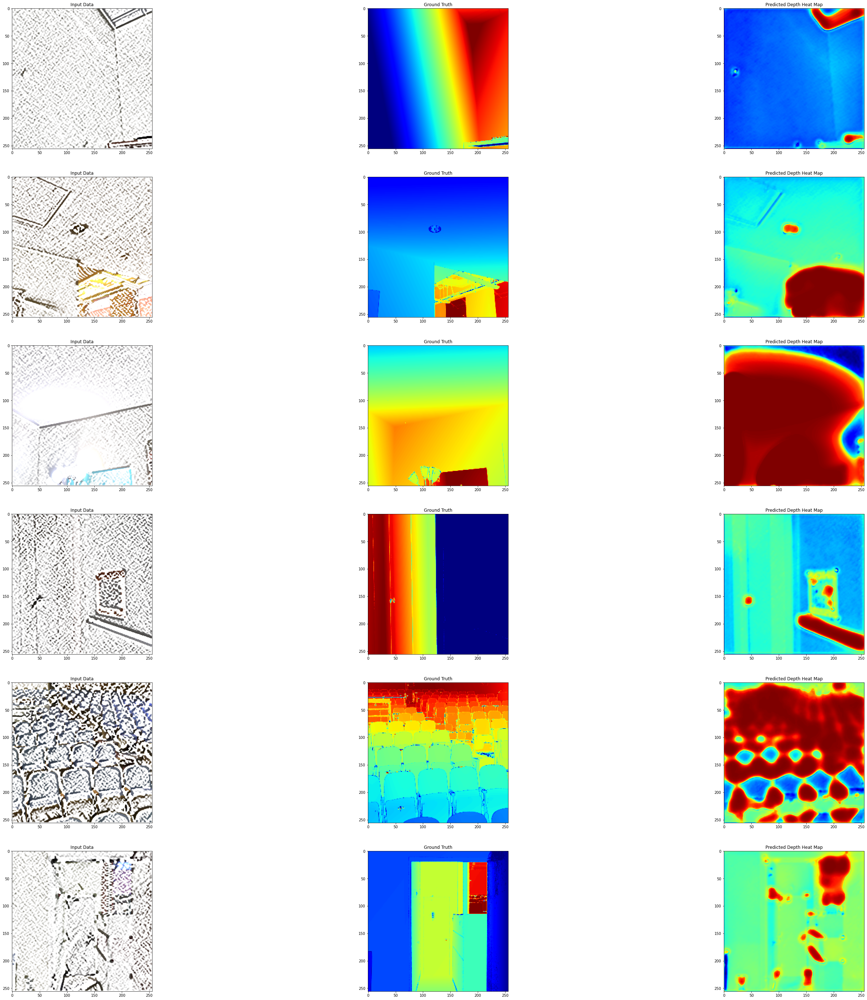

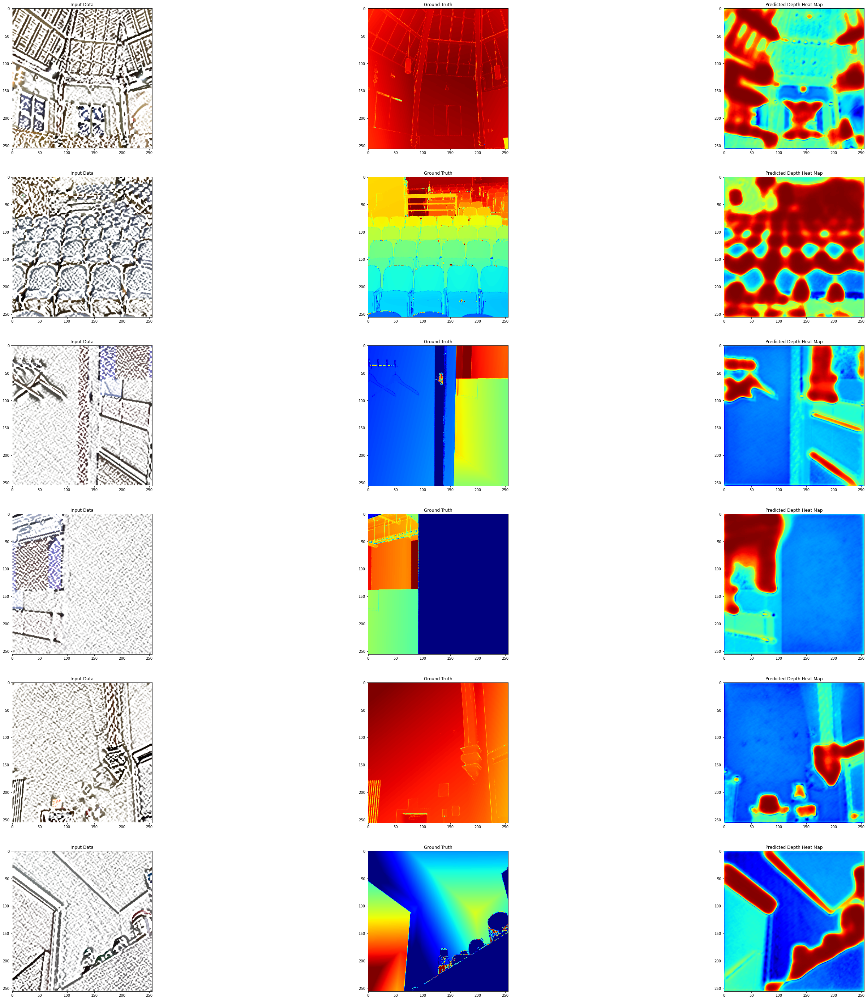

In [ ]:
##Define function to visualize the test results
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)

            ax[i, 0].set_title('Input Data')
            ax[i, 1].set_title('Ground Truth')
            ax[i, 2].set_title('Predicted Depth Heat Map')

    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)

test_loader = next(iter(DataGenerator(data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH))))
visualize_depth_map(test_loader, test=True, model=modelSobel)

test_loader = next(iter(DataGenerator(data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH))))
visualize_depth_map(test_loader, test=True, model=modelSobel)


Overall, viewing these visual test results, it seems that using the Sobel Edge modified data for this depth estimation model does work well. Some of these visual results make sense, while other ones are pretty mind-boggling. I have expressed some condensed throughts here:
* In the auditorium seats image, the seats at the front have some correct depth prediction in that the heatmap indicates these seats as blue meaning they are closer, however most of the image is red, meaning most of the depth of the rest of the auditorium is incorrect
* In row 7, the ground truth indicates that everything in the image is far away, however, our model predicts that the center of the wall is close while the left and right hand walls are far away. This is a confusing prediction as visually, I would have said the center is farther while the left and right are closer
* In row 1, the corner of the room is correctly predicted as red and farther away, but that is the only part of the prediction that is correct. In the ground truth, we can see that the depth should fade as we move away from the camera, but that is not captured by our prediction. 

Overall, I would say that this Sobel edge detection idea seemed cool, but it really has no purpose to be used for depth estimation given these results. Now I will train a model without this Sobel edge detection and see the results. 

<b>RGB Data Model</b>

This model is trained with no alteration to the data. In order to reformat the model to take in data that does not have the Sobel edge detection I will re-define the DataGenerator below. 

In [ ]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=32, dim=(768, 1024), n_channels=3, shuffle=True):
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):

        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self,image_path, depth_map, mask):
        """Load input and target image."""

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

    def data_generation(self, batch):

        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(
                self.data["image"][batch_id],
                self.data["depth"][batch_id],
                self.data["mask"][batch_id],
            )

        return x, y

Now re-train the model with regular RGB input data:

In [ ]:
##Define the optimizer to be the Adam
optimizer = tf.keras.optimizers.Adam()
modelRegular = DepthEstimationModel()

# Define the loss function
cross_entropy = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction="none")

# Compile the model
modelRegular.compile(optimizer, loss=cross_entropy)

train_loader = DataGenerator(
    data=df[:260].reset_index(drop="true"), batch_size=32, dim=(256, 256))
validation_loader = DataGenerator(
    data=df[260:].reset_index(drop="true"), batch_size=32, dim=(256, 256))

##Fit the model
modelRegular.fit(train_loader,epochs=100,validation_data=validation_loader,)

Epoch 1/100
9/9 [==============================] - 17s 1s/step - loss: 0.8959 - val_loss: 1.7705
Epoch 2/100
9/9 [==============================] - 2s 219ms/step - loss: 0.4897 - val_loss: 1.7984
Epoch 3/100
9/9 [==============================] - 2s 216ms/step - loss: 0.4061 - val_loss: 1.8017
Epoch 4/100
9/9 [==============================] - 2s 218ms/step - loss: 0.4010 - val_loss: 1.8050
Epoch 5/100
9/9 [==============================] - 2s 215ms/step - loss: 0.3668 - val_loss: 1.7188
Epoch 6/100
9/9 [==============================] - 2s 215ms/step - loss: 0.3294 - val_loss: 0.5537
Epoch 7/100
9/9 [==============================] - 2s 213ms/step - loss: 0.3826 - val_loss: 0.5340
Epoch 8/100
9/9 [==============================] - 2s 220ms/step - loss: 0.3275 - val_loss: 0.8618
Epoch 9/100
9/9 [==============================] - 2s 218ms/step - loss: 0.2991 - val_loss: 0.4892
Epoch 10/100
9/9 [==============================] - 2s 213ms/step - loss: 0.3023 - val_loss: 0.3936
Epoch 11/10

We can see that this model using the regular RGB data actually ended with a worse validation loss than the Sobel Edge detection model. It will be interesting to see how this translates onto the test data below and assess if the model using only RGB actually did worse. 

Now lets again analyze some of the visual results on the test data to see how this model performs for depth estimation:

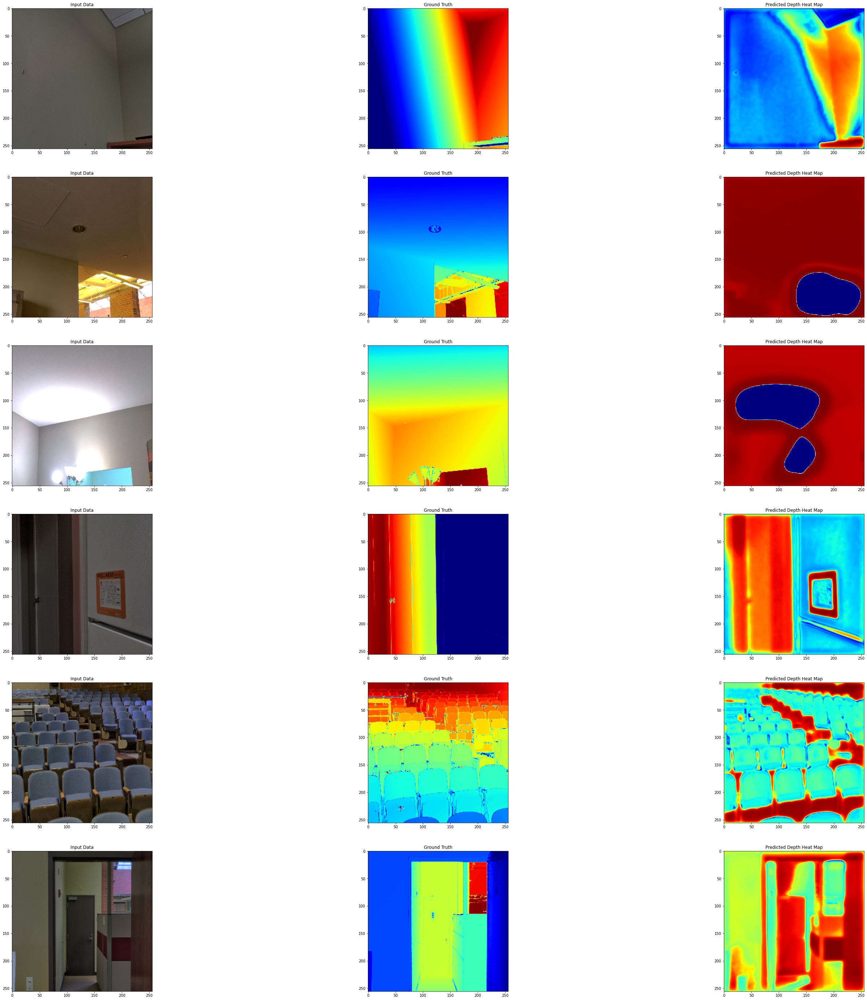

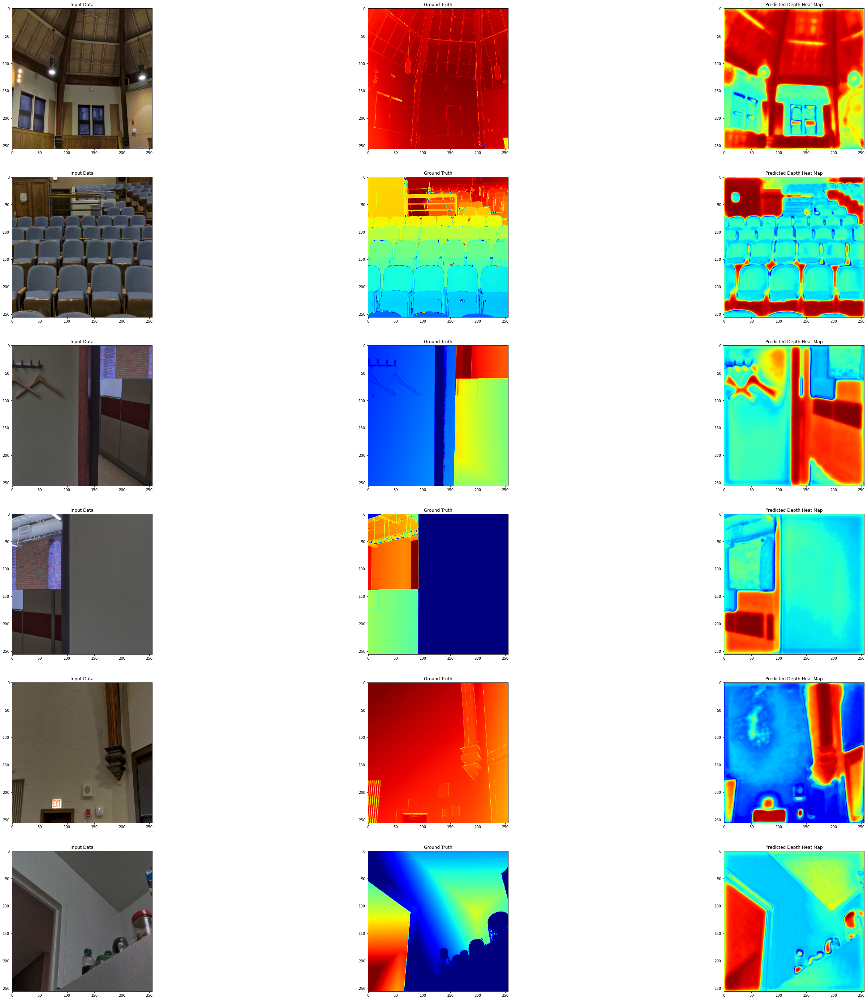

In [ ]:
test_loader = next(iter(DataGenerator(data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH))))
visualize_depth_map(test_loader, test=True, model=modelRegular)

test_loader = next(iter(DataGenerator(data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH))))
visualize_depth_map(test_loader, test=True, model=modelRegular)

The visual results of this model using the regular RGB data are significantly better than the results of the experimental model attempting to use Sobel edge detection. A couple of encouraging instances are described below:
* In the last row, row 12, the model does a very good job at recognizing that the beyond the doorway there is a greater depth, indicating our model can recognize a hallway is farther away than the room before the hallway
* Rows 2 and 3 really make no sense, the predictions seem to be blobs of small depth estimation surrounded by greater depth estimation. I hypothesize that this could be a result of some weird over-fitting occurring. 
* Row 4 is another example of the model recognizing that the further down the image is in a hallway, the greater the depth it
* Row 1 showed improved results over the Sobel edge detection modelin that it more gradually increase the depth estimation as we moved towards the corner of the wall. 

## Final Thoughts

This depth estimation task was definitely the most difficult task that I've taken on all semester and it took a lot of time to sift through the tutorial code to understand what was actually going on. However, this was undoubtedly a worthwhile experiment because of the applications to self-driving cars and robotics. From what I've read, many of the ML engineer jobs focus on robotics and other optical flow/depth estimation types tasks while it seems data scientists might take on more vanilla image classification tasks, so this experience will come in handy if I ever had an interest in doing some sort of ML Engineer job. (This is just from what I've read online but I could be wrong on this assessment). 

Another note, is that I have tried performing image transformations multiple times like this Sobel Edge detection on various reports to increase performance, but they rarely seem to work. This illustrates to me that nueral networks learn best from raw data, and having a lot of raw data. There may be some image transformations that are a useful pre-processing steps for some computer vision tasks, but I don't think depth estimation is one of them. 

